:Θέλουμε από το newsit να πάρουμε τους τίτλους των άρθρων που αναφέρονται στην λέξη "Tiktok" και γράφτηκαν κατά την περίοδο 11/07/22 - 03/07/23 (περίπου 280 άρθρα)

Θέλουμε δηλαδή τα άρθρα από τη διεύθυνση "https://www.newsit.gr/?s=tiktok"

In [1]:
import pandas as pd
%matplotlib inline
import numpy as np
import glob
from sklearn.feature_extraction.text import CountVectorizer

In [2]:
!python -m spacy download el_core_news_sm

2023-07-03 14:01:00.479493: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-03 14:01:01.296959: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 114.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [5]:
pip install selenium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.3/399.3 kB 43.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.6 MB/s eta 0:00:00


In [6]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

def scrape_newsit_tiktok():
    base_url = 'https://www.newsit.gr/page/'
    search_term = '?s=tiktok'
    titles = []
    urls = []
    dates = []

    for page_num in range(1, 15):
        url = base_url + str(page_num) + '/' + search_term
        response = requests.get(url)
        soup = BeautifulSoup(response.text, 'html.parser')

        articles = soup.find_all('article')

        for article in articles:
            title = article.find('h2').text
            url = article.find('a')['href']
            date = article.find('time')['datetime']

            titles.append(title)
            urls.append(url)
            dates.append(date)

    data = {'Title': titles, 'Date': dates, 'URL': urls}
    df = pd.DataFrame(data)

    return df

df = scrape_newsit_tiktok()
print(df)

                                                 Title  \
0    Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...   
1    Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...   
2    Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...   
3    Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...   
4    Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...   
..                                                 ...   
275  Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...   
276  Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...   
277  Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...   
278  Στα... χνάρια του TikTok το Facebook! Αυτές εί...   
279  Έρχονται μεγάλες αλλαγές στο Facebook - Θα επι...   

                          Date  \
0    2023-07-03T09:54:36+03:00   
1    2023-07-03T09:47:19+03:00   
2    2023-07-01T21:04:10+03:00   
3    2023-07-01T14:06:44+03:00   
4    2023-07-01T10:52:42+03:00   
..                         ...   
275  2022-07-29T15:33:14+03:00   
276  2022-07-29T09:55:23+03:00 

Αποθηκεύουμε το dataframe σαν csv στον drive μας

In [7]:
df = scrape_newsit_tiktok()

# Mount Google Drive
drive.mount('/content/gdrive')

# Define the path to save the CSV
path = "/content/gdrive/My Drive/newsittiktok.csv"

# Save the dataframe to a csv file
df.to_csv(path, index=False)

Mounted at /content/gdrive


Διαβάζουμε το csv αρχείο σαν dataframe

In [8]:
newsit_tiktok_df = pd.read_csv('https://drive.google.com/uc?export=download&id=1SzEgMfacNFvhQ46GyhvVS_8AfRtJrO6M')
newsit_tiktok_df.head()

,Title,Date,URL
0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,2023-07-03T09:54:36+03:00,https://www.newsit.gr/lifestyle/BTS-to-proto-v...
1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,2023-07-03T09:47:19+03:00,https://www.newsit.gr/topikes-eidhseis/mykonos...
2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,2023-07-01T21:04:10+03:00,https://www.newsit.gr/kosmos/gallia-kideytike-...
3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,2023-07-01T14:06:44+03:00,https://www.newsit.gr/topikes-eidhseis/thessal...
4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,2023-07-01T10:52:42+03:00,https://www.newsit.gr/kosmos/gallia-rekor-syll...


In [9]:
newsit_tiktok_df.shape

(280, 3)

In [10]:
newsit_tiktok_df.head()

,Title,Date,URL
0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,2023-07-03T09:54:36+03:00,https://www.newsit.gr/lifestyle/BTS-to-proto-v...
1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,2023-07-03T09:47:19+03:00,https://www.newsit.gr/topikes-eidhseis/mykonos...
2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,2023-07-01T21:04:10+03:00,https://www.newsit.gr/kosmos/gallia-kideytike-...
3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,2023-07-01T14:06:44+03:00,https://www.newsit.gr/topikes-eidhseis/thessal...
4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,2023-07-01T10:52:42+03:00,https://www.newsit.gr/kosmos/gallia-rekor-syll...


Ας μετατρέψουμε το time σε datetime

In [11]:
newsit_tiktok_df.dtypes

Title    object
Date     object
URL      object
dtype: object

In [12]:
newsit_tiktok_df.loc[0, 'Date']

'2023-07-03T09:54:36+03:00'

In [13]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from dateutil.parser import parse

In [14]:
newsit_tiktok_df['Date'] = pd.to_datetime(df['Date'], utc=True).dt.tz_localize(None)

Χωρίζουμε την ημερομηνία από την ώρα

In [15]:
newsit_tiktok_df['date'] = newsit_tiktok_df['Date'].dt.strftime('%Y-%m-%d')
newsit_tiktok_df['time'] = newsit_tiktok_df['Date'].dt.strftime('%H:%M:%S')

In [16]:
newsit_tiktok_df

,Title,Date,URL,date,time
0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,2023-07-03 06:54:36,https://www.newsit.gr/lifestyle/BTS-to-proto-v...,2023-07-03,06:54:36
1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,2023-07-03 06:47:19,https://www.newsit.gr/topikes-eidhseis/mykonos...,2023-07-03,06:47:19
2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,2023-07-01 18:04:10,https://www.newsit.gr/kosmos/gallia-kideytike-...,2023-07-01,18:04:10
3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,2023-07-01 11:06:44,https://www.newsit.gr/topikes-eidhseis/thessal...,2023-07-01,11:06:44
4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,2023-07-01 07:52:42,https://www.newsit.gr/kosmos/gallia-rekor-syll...,2023-07-01,07:52:42
...,...,...,...,...,...
275,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,2022-07-29 12:33:14,https://www.newsit.gr/lifestyle/i-dimitra-kats...,2022-07-29,12:33:14
276,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,2022-07-29 06:55:23,https://www.newsit.gr/lifestyle/o-tzeison-nter...,2022-07-29,06:55:23
277,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,2022-07-26 08:29:16,https://www.newsit.gr/lifestyle/konstantinos-a...,2022-07-26,08:29:16
278,Στα... χνάρια του TikTok το Facebook! Αυτές εί...,2022-07-22 20:15:05,https://www.newsit.gr/kosmos/Facebook-nees-all...,2022-07-22,20:15:05


Ας φτιάξουμε ένα μικρότερο dataframe...

In [17]:
short_df = newsit_tiktok_df[['Title','date','time' ]]

In [18]:
short_df

,Title,date,time
0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,2023-07-03,06:54:36
1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,2023-07-03,06:47:19
2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,2023-07-01,18:04:10
3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,2023-07-01,11:06:44
4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,2023-07-01,07:52:42
...,...,...,...
275,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,2022-07-29,12:33:14
276,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,2022-07-29,06:55:23
277,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,2022-07-26,08:29:16
278,Στα... χνάρια του TikTok το Facebook! Αυτές εί...,2022-07-22,20:15:05


In [19]:
short_df.tail()

,Title,date,time
275,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,2022-07-29,12:33:14
276,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,2022-07-29,06:55:23
277,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,2022-07-26,08:29:16
278,Στα... χνάρια του TikTok το Facebook! Αυτές εί...,2022-07-22,20:15:05
279,Έρχονται μεγάλες αλλαγές στο Facebook - Θα επι...,2022-07-15,16:25:00


In [20]:
short_df.dtypes

Title    object
date     object
time     object
dtype: object

In [21]:
short_df['date'] = pd.to_datetime(short_df['date'])

<ipython-input-21-e145fe777f26>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['date'] = pd.to_datetime(short_df['date'])


In [22]:
short_df['time'] = pd.to_datetime(short_df['time'])

<ipython-input-22-9a82e7295fb9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['time'] = pd.to_datetime(short_df['time'])


In [23]:
short_df.dtypes

Title            object
date     datetime64[ns]
time     datetime64[ns]
dtype: object

In [24]:
short_df['year'] = pd.DatetimeIndex(short_df['date']).year
short_df['month'] = pd.DatetimeIndex(short_df['date']).month
short_df['day'] = pd.DatetimeIndex(short_df['date']).day
short_df['hour'] = pd.DatetimeIndex(short_df['time']).hour


<ipython-input-24-21f8c06a5029>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['year'] = pd.DatetimeIndex(short_df['date']).year


In [25]:
short_df.head()

,Title,date,time,year,month,day,hour
0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,2023-07-03,2023-07-03 06:54:36,2023,7,3,6
1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,2023-07-03,2023-07-03 06:47:19,2023,7,3,6
2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,2023-07-01,2023-07-03 18:04:10,2023,7,1,18
3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,2023-07-01,2023-07-03 11:06:44,2023,7,1,11
4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,2023-07-01,2023-07-03 07:52:42,2023,7,1,7


In [26]:
short_df.tail()

,Title,date,time,year,month,day,hour
275,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,2022-07-29,2023-07-03 12:33:14,2022,7,29,12
276,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,2022-07-29,2023-07-03 06:55:23,2022,7,29,6
277,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,2022-07-26,2023-07-03 08:29:16,2022,7,26,8
278,Στα... χνάρια του TikTok το Facebook! Αυτές εί...,2022-07-22,2023-07-03 20:15:05,2022,7,22,20
279,Έρχονται μεγάλες αλλαγές στο Facebook - Θα επι...,2022-07-15,2023-07-03 16:25:00,2022,7,15,16


<Axes: >

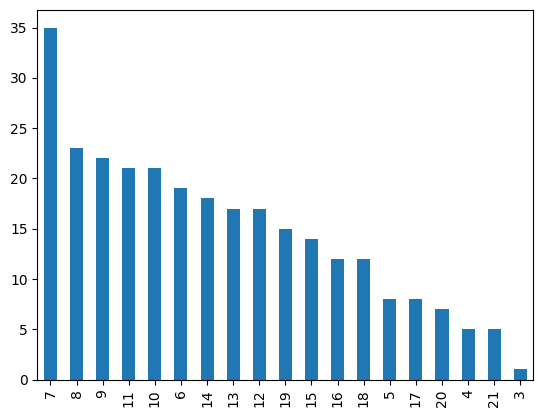

In [27]:
short_df['hour'].value_counts().plot(kind='bar')

<Axes: >

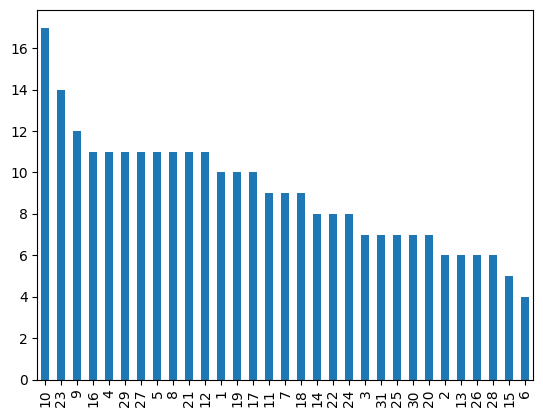

In [28]:
short_df['day'].value_counts().plot(kind='bar')

<Axes: >

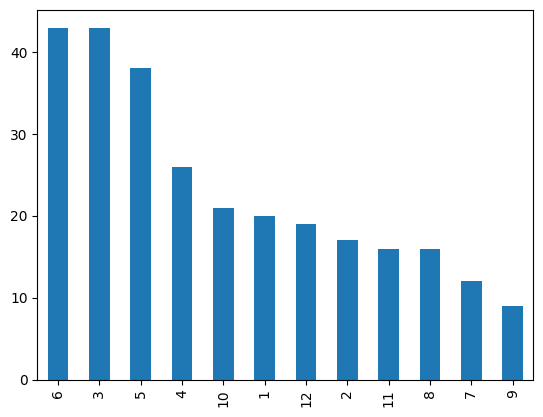

In [29]:
short_df['month'].value_counts().plot(kind='bar')

<Axes: >

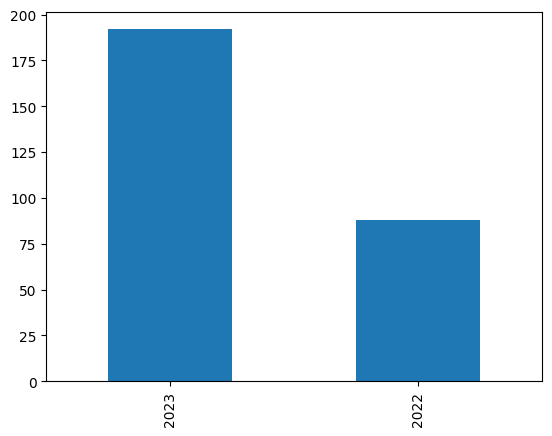

In [30]:
short_df['year'].value_counts().plot(kind='bar')

In [31]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt


In [32]:
short_df[short_df['hour']==15]['Title']

6      Ο Μακρόν βγάζει τεθωρακισμένα στους δρόμους το...
25     «Μαγική» γαμήλια φωτογράφιση στην Τσιμισκή - Γ...
37             Τι έψαξαν τα παιδιά στο internet πέρυσι\n
44     Με κορονοϊό ο Κυριάκος Μητσοτάκης - Ακυρώνεται...
86     Ο Κυριάκος Μητσοτάκης απαντά στο ερώτημα ποιος...
141    Νίκος Οικονομόπουλος: Του πέταξαν στο πρόσωπο ...
153    Χαμός με την Πάολα που επέλεξε να τραγουδήσει ...
195    Απίστευτο κράξιμο στον Salt Bae από πελάτη του...
209    Η Άννα Βίσση μιλά με τον... καθρέφτη της - Το ...
212    Ο μικρός «ήρωας» από το TikTok που δώρισε 50.0...
213    Γυναίκα που παντρεύτηκε μια πάνινη κούκλα, ισχ...
223    Γιατί τα μωρά στη Δανία κοιμούνται έξω μόνα το...
251    Εξπρές Σάμινα: Εκδηλώσεις μνήμης στην Πάρο για...
263    Η Σάνα Μαρίν έκανε τεστ για ναρκωτικά - Τι απά...
Name: Title, dtype: object

<Axes: >

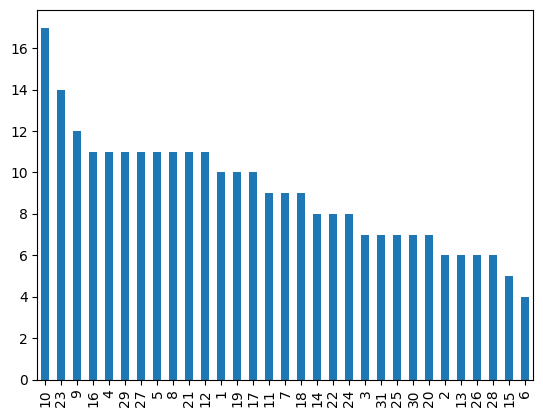

In [33]:
short_df['day'].value_counts().plot(kind='bar')

In [34]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
#text = short_df['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')


Τα κάνουμε ένα κείμενο

In [35]:
Title = short_df[short_df['day']==21]['Title'].str.cat(sep = ' ').replace("amp", ' ')


In [36]:
Title

'Get ready with me! Ο Κυριάκος Μητσοτάκης «ξαναχτυπά» με νέο βιντεάκι στο TikTok\n Ολυμπιακός - Ρεάλ Μαδρίτης: Έτοιμη για το γήπεδο η «χούλιγκαν» Μπέριλ ΜακΚίσικ\n Το μήνυμα Τσίπρα στους νέους: «Τι έγινε bro; Πάμε κάλπη σήμερα;»\n Η Ολλανδία απαγορεύει στους δημόσιους υπαλλήλους να χρησιμοποιούν το Tik Tok - Έρευνα και στην Ιταλία\n Φωτιές και μίσος για το έγκλημα στην Ξάνθη - Βίντεο ντοκουμέντο από τον εμπρησμό στο σπίτι του δράστη\n Ο εμπρησμός που δείχνει βεντέτα μετά τη στυγερή δολοφονία του 45χρονου στο Δροσερό της Ξάνθης\n «Έκρηξη» στο Βόρειο Σέλας κατέγραψε φοιτητής - Συγκλονιστικές εικόνες\n Λάρισα: Ρομά ανέβασε βίντεο στο TikTok για δολοφονίες αστυνομικών – «Να τους καθαρίσουμε έναν έναν»\n Η σιωπηρή παραίτηση ταράζει τα νερά στην εργασία\n Κίνα: Οργή για τον θάνατο 14χρονης σε κέντρο καραντίνας για τον κορονοϊό\n Μωρό τρομάζει από κεραυνό αλλά... ο μπαμπάς του είναι εκεί!  \n'

In [37]:
list(STOPWORDS)[0:20]

["i'll",
 'there',
 'nor',
 'therefore',
 "we'd",
 "i'm",
 'through',
 'yourself',
 'myself',
 "hasn't",
 'here',
 "she'll",
 'a',
 'these',
 "wasn't",
 'under',
 'each',
 'which',
 "they'll",
 'or']

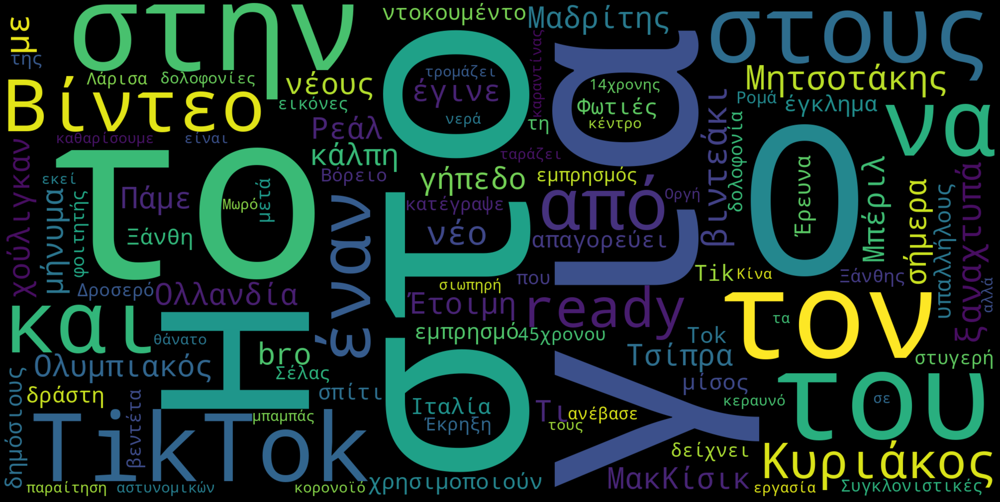

In [38]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(Title)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Ας ψάξουμε τα Ελληνικά stopwords.....

In [39]:
import spacy

In [40]:
!python -m spacy download el_core_news_sm

# Επειτα κάνουμε Runtime ->  Restart Runtime, για να δει τις αλλαγές από το download...

2023-07-03 14:02:56.655348: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 112.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [41]:
nlp = spacy.load('el_core_news_sm')

In [42]:
list(nlp.Defaults.stop_words)[0:20]

['ως',
 'αλλού',
 'οσοδήποτε',
 'εκείνου',
 'ορισμένως',
 'αυτοί',
 'εσύ',
 'ετούτους',
 'ίδιο',
 'στους',
 'κάμποσα',
 'αλλιώτικα',
 'τόσων',
 'αυτό',
 'συνεπώς',
 'συχνό',
 'επί',
 'εντός',
 'έκαστοι',
 'ου']

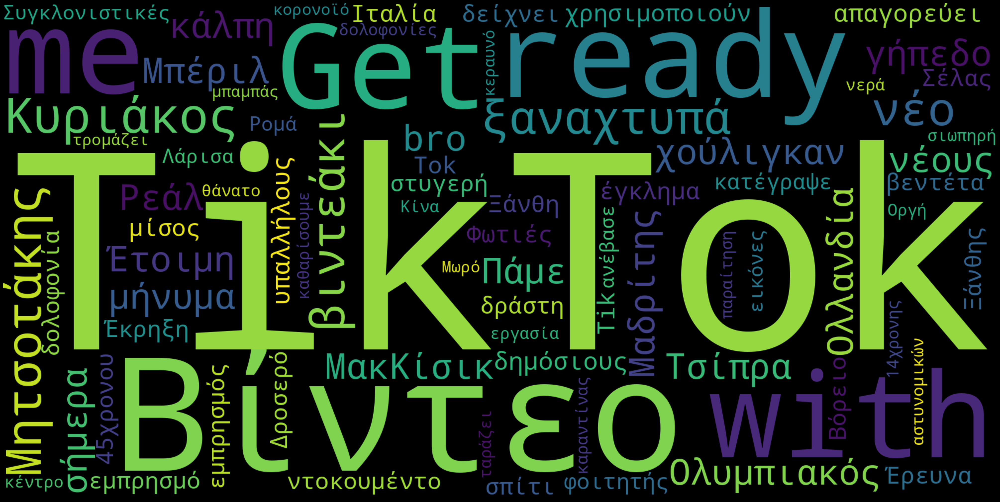

In [43]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(Title)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Ας βρούμε για καθε λέξη που βρίσκεται σε διαφορετικές πτώσεις στην ονομαστική, και τα ρήματα στο 1ο πρόσωπο...

In [44]:
doc = nlp(short_df['Title'][1])

In [45]:
for token in doc:
    print(token, token.lemma_)

Γνωστή Γνωστής
influencer influencer
εξηγεί εξηγώ
γιατί γιατί
πλήρωσε πληρώνω
616 616
ευρώ ευρώ
για για
ένα ένας
ψάρι ψάρι
στη σε ο
Μύκονο Μύκονο
- -
« «
Αυτό αυτός
ήταν είμαι
το ο
λάθος λάθος
μου μου
» »

 



In [46]:
' '.join(token.lemma_ for token in doc)

'Γνωστής influencer εξηγώ γιατί πληρώνω 616 ευρώ για ένας ψάρι σε ο Μύκονο - « αυτός είμαι ο λάθος μου » \n'

In [47]:
Title

'Get ready with me! Ο Κυριάκος Μητσοτάκης «ξαναχτυπά» με νέο βιντεάκι στο TikTok\n Ολυμπιακός - Ρεάλ Μαδρίτης: Έτοιμη για το γήπεδο η «χούλιγκαν» Μπέριλ ΜακΚίσικ\n Το μήνυμα Τσίπρα στους νέους: «Τι έγινε bro; Πάμε κάλπη σήμερα;»\n Η Ολλανδία απαγορεύει στους δημόσιους υπαλλήλους να χρησιμοποιούν το Tik Tok - Έρευνα και στην Ιταλία\n Φωτιές και μίσος για το έγκλημα στην Ξάνθη - Βίντεο ντοκουμέντο από τον εμπρησμό στο σπίτι του δράστη\n Ο εμπρησμός που δείχνει βεντέτα μετά τη στυγερή δολοφονία του 45χρονου στο Δροσερό της Ξάνθης\n «Έκρηξη» στο Βόρειο Σέλας κατέγραψε φοιτητής - Συγκλονιστικές εικόνες\n Λάρισα: Ρομά ανέβασε βίντεο στο TikTok για δολοφονίες αστυνομικών – «Να τους καθαρίσουμε έναν έναν»\n Η σιωπηρή παραίτηση ταράζει τα νερά στην εργασία\n Κίνα: Οργή για τον θάνατο 14χρονης σε κέντρο καραντίνας για τον κορονοϊό\n Μωρό τρομάζει από κεραυνό αλλά... ο μπαμπάς του είναι εκεί!  \n'

In [48]:
full_doc = nlp(Title)

In [49]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [50]:
clear_text[200:400]

' « Τι γίνομαι bro ; Πάμε κάλπη σήμερα ; » \n  ο Ολλανδία απαγορεύω σε ο δημόσιος υπαλλήλος να χρησιμοποιώ ο Tik Tok - Έρευνα και σε ο Ιταλία \n  Φωτιές και μίσος για ο έγκλημα σε ο Ξάνθη - Βίντεο ντοκου'

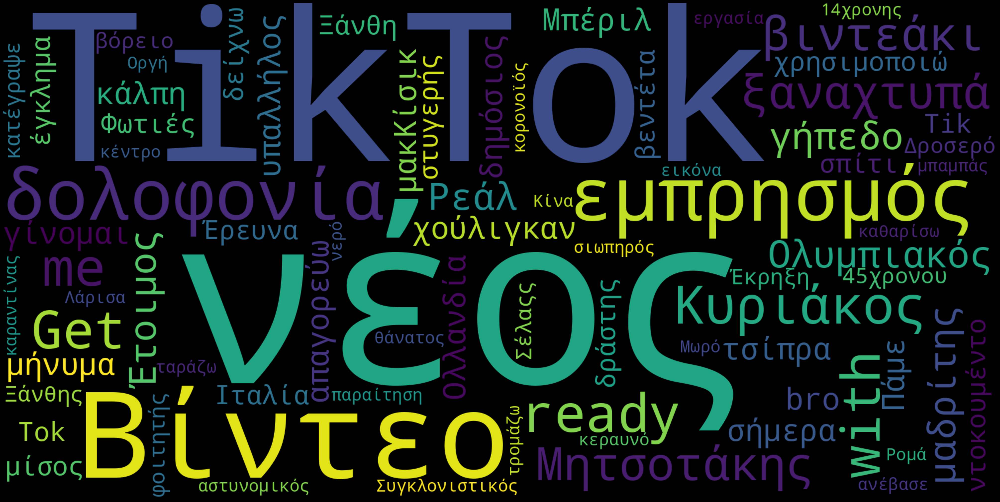

In [51]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

αφαιρούμε τη λέξη "Tiktok"

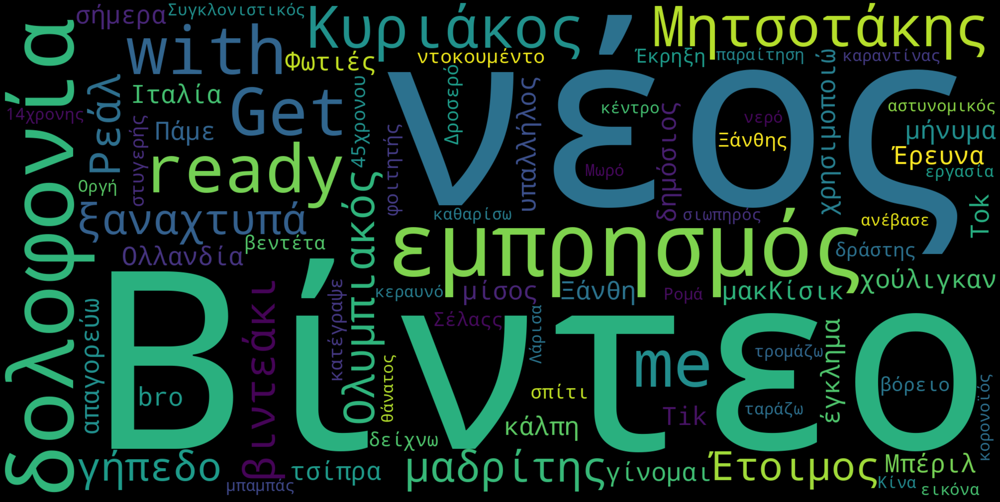

In [52]:
stopwords = nlp.Defaults.stop_words.union(['Tiktok'])

wordcloud = WordCloud(
    stopwords = stopwords,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Vectorization

In [53]:
from sklearn.feature_extraction.text import CountVectorizer

Φτιάχνουμε έναν vectorizer με τις default παραμέτρους, δηλαδή χωρίς να βάλουμε τίποτα μέσα στην παρένθεση)

In [54]:
cv = CountVectorizer()

In [55]:
count_vector = cv.fit_transform(short_df['Title'])

In [56]:
count_vector.shape

(280, 1693)

In [57]:
count_vector

<280x1693 sparse matrix of type '<class 'numpy.int64'>'
	with 3603 stored elements in Compressed Sparse Row format>

Φτιάχνουμε ένα dataframe με τα αποτελέσματα του vectorizer.

In [58]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,000,10,100,1000,120,14,14χρονης,15,15χρονης,16χρονο,...,όπου,όρος,όσα,όσκαρ,όσους,όταν,ότι,όχι,ώρα,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Vectorizer με stop words

In [59]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words))

In [60]:
count_vector = cv.fit_transform(short_df['Title'])

In [61]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,000,10,100,1000,120,14,14χρονης,15,15χρονης,16χρονο,...,ψηφίσουμε,ψηφίσουν,ψυχαγωγικού,ψυχολογία,ψυχρώ,ψύχραιμοι,όμορφη,όρος,όσκαρ,ώρα
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Vectorizer με stop words και όρια στις συχνότητες εμφάνισης των λέξεων

In [62]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), min_df=0.01, max_df=0.95)

In [63]:
count_vector = cv.fit_transform(short_df['Title'])

In [64]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())

results.head()

,000,15χρονης,2022,45χρονου,50,backstage,bullying,gomez,huawei,media,...,τηλέφωνα,τσίπρα,τσίπρας,τσιμισκή,φορά,φυλακή,χαμός,χορεύει,χρήση,χρόνια
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**Vectorizer με stop words και max_features**

In [65]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20)
count_vector = cv.fit_transform(short_df['Title'])
results1 = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results1.head()

,000,media,tik,tiktok,tok,viral,απίστευτο,βίντεο,γαλλία,δείτε,δύο,ηπα,θεσσαλονίκη,κυριάκος,μητσοτάκη,μητσοτάκης,νέο,ξάνθη,παιδιά,χαμός
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


Συχνότερες λέξεις

In [66]:
results1.sum(axis =0).sort_values(ascending = False)

tiktok         77
βίντεο         47
μητσοτάκης     23
tik            20
tok            18
viral          18
μητσοτάκη      15
κυριάκος       12
νέο            11
ηπα            11
δείτε           9
ξάνθη           9
θεσσαλονίκη     9
γαλλία          6
000             5
παιδιά          5
δύο             5
media           5
απίστευτο       5
χαμός           5
dtype: int64

<Axes: >

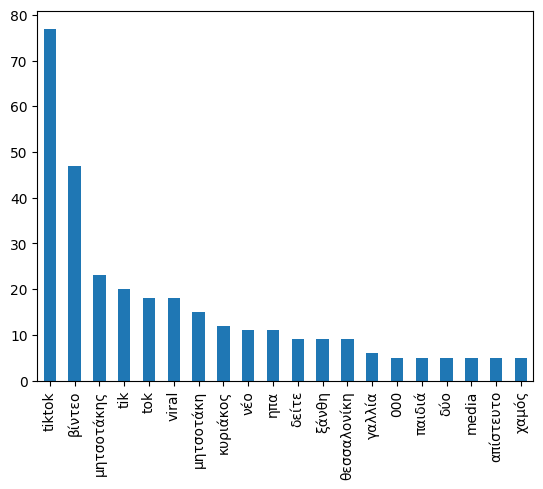

In [67]:
results1.sum(axis =0).sort_values(ascending = False).plot (kind = 'bar')

Vectorizer με stop words, max features και token pattern

In [68]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=200, token_pattern = '\\bμητσοτάκ[α-ωά-ώ]*\\b')
count_vector = cv.fit_transform(short_df['Title'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results.head()

,μητσοτάκη,μητσοτάκης
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


Vectorizer με ngrams

In [69]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2, 2))
count_vector = cv.fit_transform(short_df['Title'])
results4 = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results4.head()

,selena gomez,social media,tik tok,tik toker,viral βίντεο,έγκλημα ξάνθη,ανέβασε βίντεο,απίστευτο βίντεο,βίντεο tiktok,βίντεο μητσοτάκη,βίντεο ντοκουμέντο,γίνεται viral,γίνονται viral,δέσποινα βανδή,ενέργειας 2022,κιμ καρντάσιαν,κυριάκος μητσοτάκης,μητσοτάκη tiktok,νέο βίντεο,σαρώνει tiktok
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Τα συχνότερα διγράμματα (bigrams)

In [70]:
results4.sum(axis =0).sort_values(ascending = False)

tik tok                18
κυριάκος μητσοτάκης    12
βίντεο tiktok          12
μητσοτάκη tiktok       11
νέο βίντεο              7
βίντεο μητσοτάκη        7
ανέβασε βίντεο          5
δέσποινα βανδή          4
viral βίντεο            4
social media            4
γίνονται viral          4
selena gomez            3
κιμ καρντάσιαν          3
σαρώνει tiktok          3
γίνεται viral           3
απίστευτο βίντεο        3
έγκλημα ξάνθη           3
ενέργειας 2022          2
tik toker               2
βίντεο ντοκουμέντο      2
dtype: int64

<Axes: >

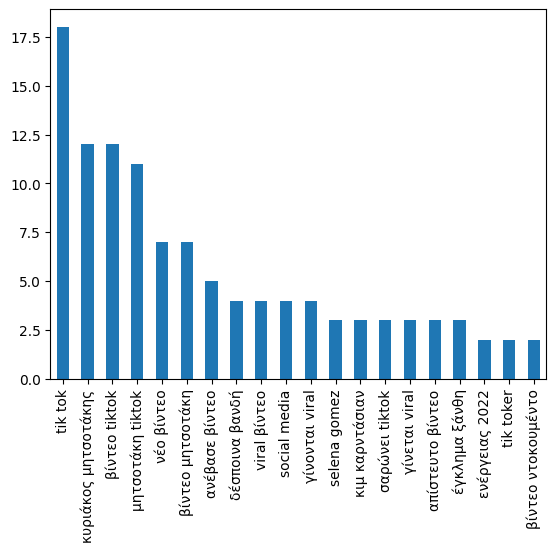

In [71]:
results4.sum(axis =0).sort_values(ascending = False). plot (kind = 'bar')

<Axes: >

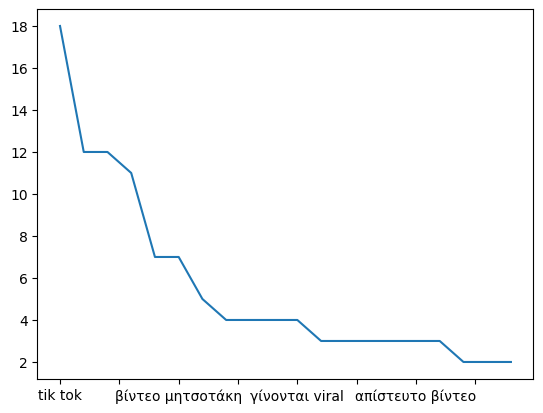

In [72]:
results4.sum(axis=0).sort_values(ascending=False).plot(kind='line')

In [73]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()

μητσοτάκης    23
μητσοτάκη     15
dtype: int64

Vectorizer με χρήση λεξικού

In [151]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20,
                     vocabulary = ['μητσοτάκη', 'γαλλία', 'θεσσαλονίκη', 'chatgpt'])
count_vector = cv.fit_transform(short_df['Title'])
results5 = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out())
results5.head()

,μητσοτάκη,γαλλία,θεσσαλονίκη,chatgpt
0,0,0,0,0
1,0,0,0,0
2,0,1,0,0
3,0,0,0,0
4,0,1,0,0


<Axes: >

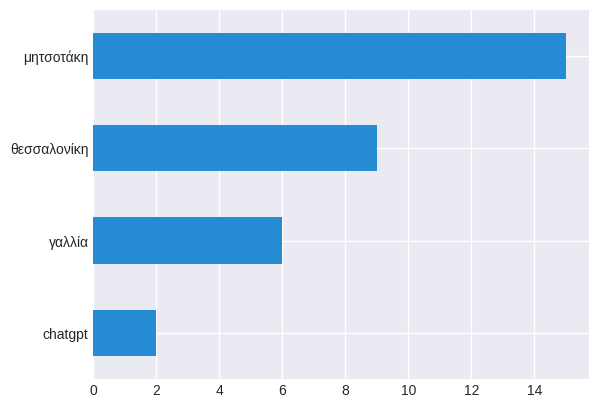

In [152]:
results5.sum(axis =0).sort_values(ascending = True).plot(kind = 'barh')

TfidfVectorizer

In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [77]:
tfidf_vectorizer = TfidfVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(short_df['Title'])  #finds the tfidf score with normalization

In [154]:
results2 = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
results2.head()

,000,10,100,15χρονης,2022,25,45χρονου,50,amita,backstage,...,φουρέιρα,φυλακή,φόβοι,χαμός,χορεύει,χορό,χρήση,χρόνια,όρος,ώρα
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.412572,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


<Axes: >

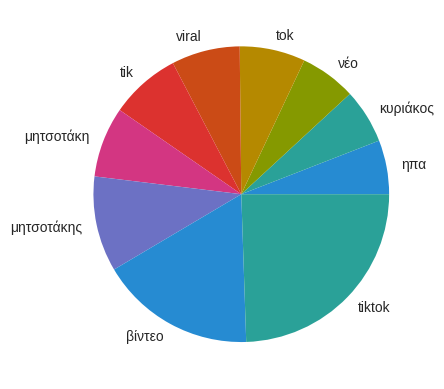

In [155]:
results2.sum(axis=0).nlargest(10).sort_values(ascending=True).plot(kind='pie')

Cosine similarity (ομοιότητα κειμένων)

In [80]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))

cosine scores ==>  [[1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.38088748 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.      

In [81]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train) # συγκρίνουμε όλα τα άρθρα μεταξύ τους

Ας δούμε ποια άρθρα μοιάζουν περισσότερο με το 4ο

<Axes: >

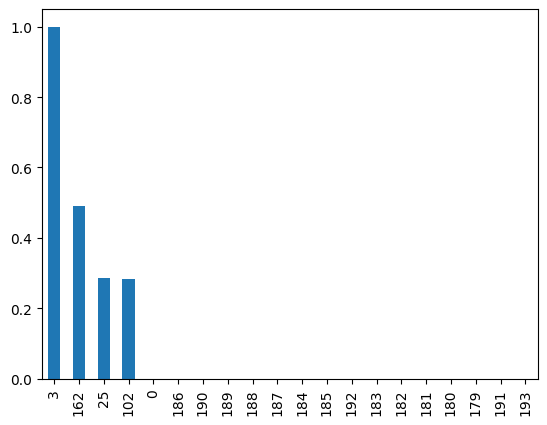

In [82]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

Βλέπουμε ότι με το 4ο άρθρο μοιάζει περισσότερο το 3ο

In [83]:
short_df['Title'].loc[3]

'Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκωσε οχιά - Φίδι βγήκε «βόλτα» στην Τσιμισκή\n'

In [84]:
short_df['Title'].loc[2]

'Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρόμους - Με δύο χρόνια φυλάκιση απειλεί η κυβέρνηση τους γονείς\n'

Ας δούμε την ομοιότητα των 10 πρώτων άρθρων σε ένα γράφημα (heatmap)

In [85]:
arr = cosine_similarity(tfidf_matrix_train[0:10], tfidf_matrix_train[0:10]) # συγκρίνουμε τα 10 πρώτα άρθρα μεταξύ τους

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

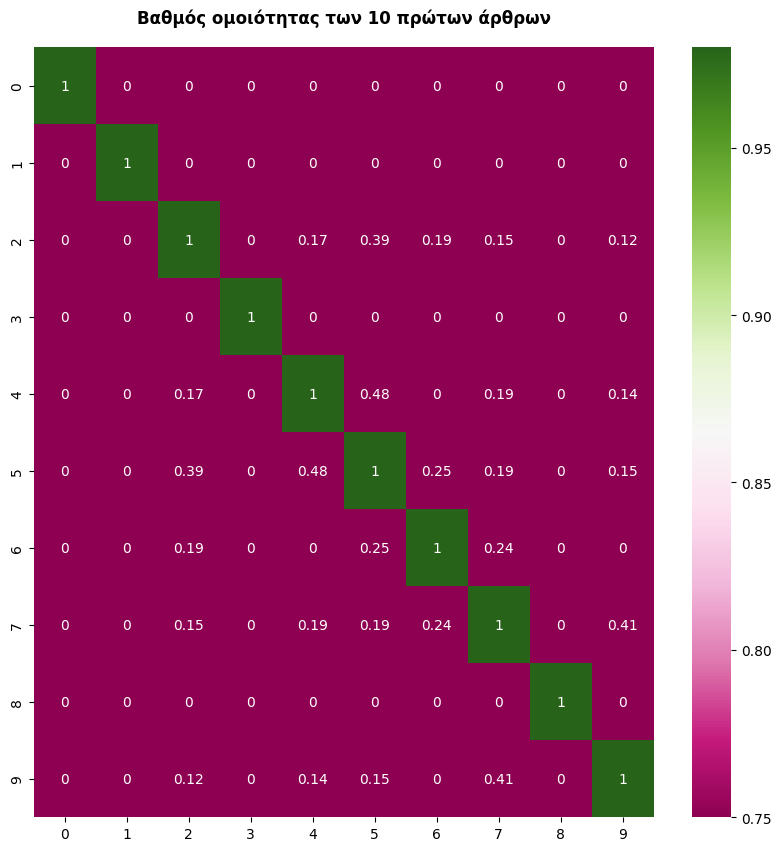

In [87]:
plt.figure(figsize=(10, 10))
#annot = True #to print the values inside the square
plt.title('Βαθμός ομοιότητας των 10 πρώτων άρθρων', y=1.02, fontweight='bold') # το y ορίζει την απόσταση του τίτλου από το γράφημα
sns.heatmap(data=arr, annot=True, vmin=0.75, vmax=0.98, cmap="PiYG")

plt.savefig('<fig>.png')

Συναισθηματική ανάλυση

Σύνδεση του gdrive για να φέρουμε τα csvs των κειμένων και να αποθηκεύουμε csvs ή εικόνες που φτιάχνουμε

In [88]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Διαβάζουμε το EmoLex (συναισθηματικό λεξικό

In [89]:
filepath = "https://raw.githubusercontent.com/datajour-gr/DataJournalism/main/Bachelor%20Lessons%202023/Lesson%2010/NRC_GREEK_Translated_6_2020.csv"

In [90]:
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [91]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


drop_duplicates() και dropna()

In [92]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(inplace = True, drop=True)

Φτιάχνουμε ένα df με το date & το Title

In [93]:
shorter_df = short_df[['date','Title' ]]
#shorter_efsyn_df = short_efsyn_df.rename(columns={'full_text': 'text'} )

In [94]:
shorter_df

,date,Title
0,2023-07-03,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...
1,2023-07-03,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...
2,2023-07-01,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...
3,2023-07-01,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...
4,2023-07-01,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...
...,...,...
275,2022-07-29,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...
276,2022-07-29,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...
277,2022-07-26,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...
278,2022-07-22,Στα... χνάρια του TikTok το Facebook! Αυτές εί...


In [95]:
shorter_df.dtypes

date     datetime64[ns]
Title            object
dtype: object

In [96]:
# εαν θέλουμε να πετάξουμε urls που μπορεί να υπάρχουν στο κείμενο
shorter_df['Title'] = shorter_df['Title'].str.replace(r'https?:\/\/.*[\r\n]*'," ", regex=True)

<ipython-input-96-5c244a0c5ee1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shorter_df['Title'] = shorter_df['Title'].str.replace(r'https?:\/\/.*[\r\n]*'," ", regex=True)


Φτιάχνουμε έναν vectorizer από τις λέξεις του συναισθηματικού λεξικού

In [97]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [98]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word,
                      lowercase=False,
                      strip_accents = 'unicode',
                      stop_words= list(nlp.Defaults.stop_words),
                      ngram_range=(1, 2))

Μετράμε πόσες φορές εμφανίζονται οι λέξεις του συναισθηματικού λεξικού στα κείμενα των άρθρων

In [99]:
matrix = vec.fit_transform(shorter_df['Title'])
vocab = vec.get_feature_names_out()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια', 'βεβαιοτατα', 'γιατι', 'γρηγορα', 'γυρω', 'δεινα', 'δεξια', 'δηθεν', 'δηλαδη', 'διαρκως', 'δικα', 'δικο', 'δικοι', 'δικος', 'δικου', 'δικους', 'διολου', 'διπλα', 'διχως', 'εαν', 'εαυτο', 'εαυτον', 'εαυτου', 'εαυτους', 'εαυτων', 'εγιναν', 'εγινε',

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [100]:
wordcount_df.shape

(280, 13161)

Φτιάχνουμε λίστες με τις λέξεις για θετικότητα/αρνητικότητα και για κάθε συναίσθημα

In [101]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [102]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [103]:
# Φτιάξε μια λίστα με positive words
positive_words = emolex_df[emolex_df.Positive == 1]['word']

# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']

# Φτιάξε μια λίστα με anger words
angry_words = emolex_df[emolex_df.Anger == 1]['word']

# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']

# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']

# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']

# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']

In [104]:
trust_words

8                        αμην
15             γαμηλιο ταξιδι
24       διευθυντρια σχολειου
38                 επικοινωνω
45                   εκκλησια
                 ...         
13039                  αληθης
13075             αναμφιβολως
13079             ανυπερβατος
13113            αναθηματικος
13114       αποδειξη πληρωμης
Name: word, Length: 1259, dtype: object

Οι λέξεις/φράσεις της κάθε λίστας είναι ονόματα στηλών στο wordcount_df

In [105]:
wordcount_df.tail(1)

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Αν εφαρμόσουμε τη λίστα με τις λέξεις/φράσεις ενός συναισθήματος σαν επιλογέα στηλών στο wordcount_df, μπορούμε να "φιλτράρουμε" μόνο αυτές τις συγκεκριμένες στήλες

In [106]:
wordcount_df[trust_words].tail(1)

,αμην,γαμηλιο ταξιδι,διευθυντρια σχολειου,επικοινωνω,εκκλησια,εν τω μεταξυ,ευαγγελιο,κυριε,λιστα ελεγχου,λυρικη σκηνη,...,ηλιακο ωρολογιο,συνεργιστικος,διπλο ποδηλατο,ισαξιος,ανακωχη,αληθης,αναμφιβολως,ανυπερβατος,αναθηματικος,αποδειξη πληρωμης
279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Αν στο τέλος προσθέσουμε την εντολή sum(axis=1) θα πάρουμε το άθροισμα των εμφανίσεων όλων των λέξεων/φράσεων ενός συναισθήματος σε κάθε άρθρο

In [107]:
wordcount_df[trust_words].sum(axis=1)

0      0
1      0
2      1
3      0
4      0
      ..
275    0
276    0
277    0
278    0
279    0
Length: 280, dtype: int64

Στο df των άρθρων, δημιουργούμε νέες στήλες (μία για κάθε συναίσθημα) με τιμές το σύνολο των εμφανίσεων λέξεων/φράσεων κάθε συναισθήματος σε κάθε άρθρο

In [108]:
shorter_df['anger'] = wordcount_df[angry_words].sum(axis=1)

shorter_df['positive'] = wordcount_df[positive_words].sum(axis=1)

shorter_df['joy'] = wordcount_df[joy_words].sum(axis=1)

shorter_df['disgust'] = wordcount_df[disgust_words].sum(axis=1)

shorter_df['surprise'] = wordcount_df[surprise_words].sum(axis=1)

shorter_df['trust'] = wordcount_df[trust_words].sum(axis=1)

shorter_df['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)

shorter_df['sadness'] = wordcount_df[sadness_words].sum(axis=1)

shorter_df['negative'] = wordcount_df[negative_words].sum(axis=1)

shorter_df['fear'] = wordcount_df[fear_words].sum(axis=1)

<ipython-input-108-bb356050de26>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shorter_df['anger'] = wordcount_df[angry_words].sum(axis=1)
<ipython-input-108-bb356050de26>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shorter_df['positive'] = wordcount_df[positive_words].sum(axis=1)
<ipython-input-108-bb356050de26>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [109]:
shorter_df

,date,Title,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2023-07-03,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,0,0,0,0,0,0,0,0,0,0
1,2023-07-03,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,0,0,0,0,0,0,0,1,1,0
2,2023-07-01,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,1,1,0,1,0,1,0,1,2,2
3,2023-07-01,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,1,0,0,1,0,0,0,1,1,1
4,2023-07-01,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,1,0,0,0,1,0,0,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
275,2022-07-29,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,0,0,0,0,0,0,0,0,0,0
276,2022-07-29,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,0,0,0,0,0,0,0,0,0,0
277,2022-07-26,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,0,0,0,0,0,0,0,0,0,0
278,2022-07-22,Στα... χνάρια του TikTok το Facebook! Αυτές εί...,0,0,0,0,0,0,0,0,0,0


Κάνουμε index τη στήλη date

In [132]:
shorter_df.reset_index(inplace=True)
shorter_df.set_index('date', inplace=True)
shorter_df

,index,Title,anger,positive,joy,disgust,surprise,trust,anticipation,sadness,negative,fear,pos/neg,(-)αρνητικότητα | θετικότητα(+)
date,,,,,,,,,,,,,,
2023-07-03,0,Το πρώτο βιβλίο για το φαινόμενο BTS κυκλοφορε...,0,0,0,0,0,0,0,0,0,0,0,NaN
2023-07-03,1,Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρ...,0,0,0,0,0,0,0,1,1,0,-1,-100.0
2023-07-01,2,Η Γαλλία φλέγεται! Χιλιάδες ανήλικοι στους δρό...,1,1,0,1,0,1,0,1,2,2,-1,-33.0
2023-07-01,3,Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκ...,1,0,0,1,0,0,0,1,1,1,-1,-100.0
2023-07-01,4,Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία -...,1,0,0,0,1,0,0,2,1,1,-1,-100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-29,275,Η Δήμητρα Κατσαφάδου προσπαθεί να κάνει μπάνιο...,0,0,0,0,0,0,0,0,0,0,0,NaN
2022-07-29,276,Ο Τζέισον Ντερούλο ξεσήκωσε τους θαυμαστές το ...,0,0,0,0,0,0,0,0,0,0,0,NaN
2022-07-26,277,Κωνσταντίνος Αργυρός: Θαυμάστρια του πέταξε σο...,0,0,0,0,0,0,0,0,0,0,0,NaN


Μετράμε τον μ.ο. του αριθμού των λέξεων των τίτλων ανά ημέρα

<Axes: xlabel='date'>

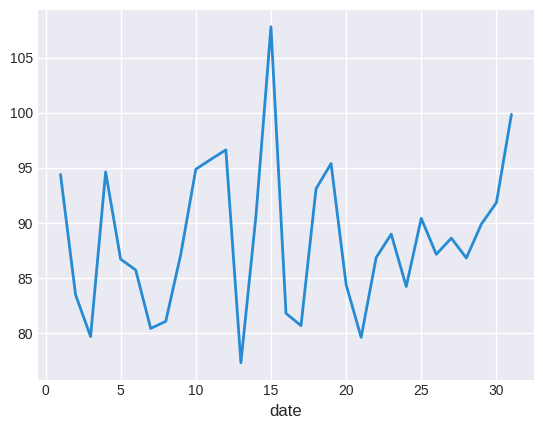

In [133]:
shorter_df['Title'].str.len().groupby(by=shorter_df.index.day).mean().plot()

<Axes: xlabel='date'>

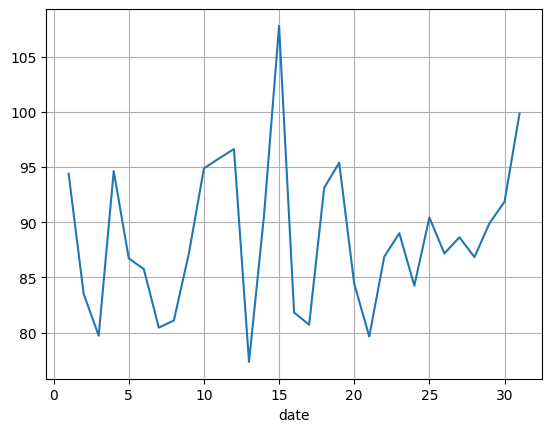

In [112]:
shorter_df['Title'].str.len().groupby(by=shorter_df.index.day).mean().plot(grid=True)

<Axes: xlabel='date'>

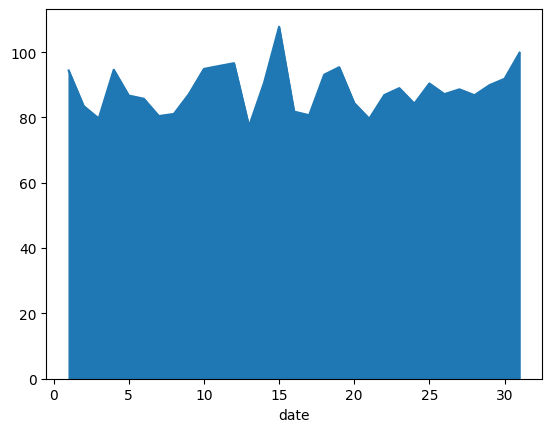

In [113]:
shorter_df['Title'].str.len().groupby(by=shorter_df.index.day).mean().plot(kind='area')

Πλήθος άρθρων ανά μήνα

<Axes: ylabel='date'>

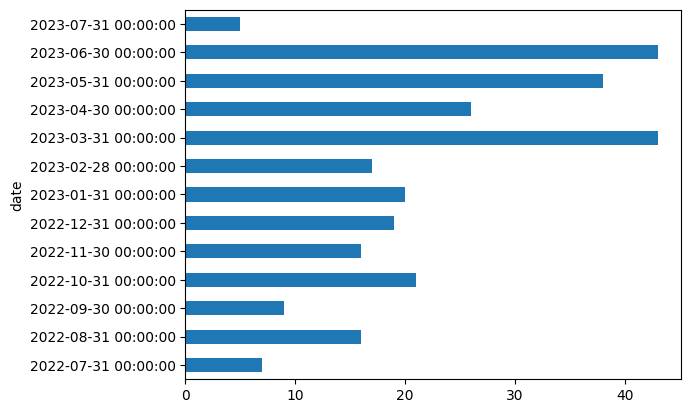

In [114]:
shorter_df['Title'].resample('M').count().plot(kind='barh')

Μετράμε τη θετικότητα/αρνητικότητα και το συναισθηματικό πρόσιμο των άρθρων ανά μήνα

<Axes: xlabel='date'>

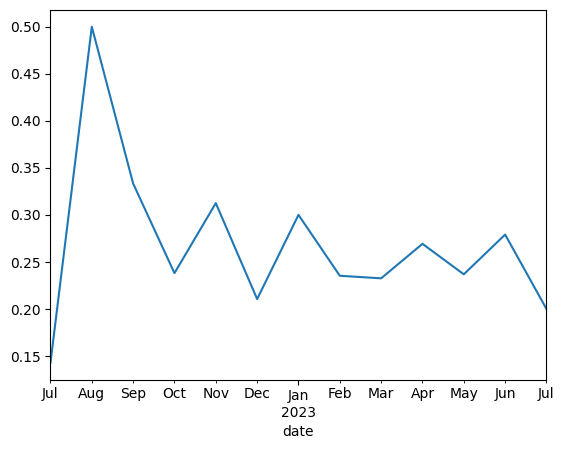

In [115]:
shorter_df['positive'].resample('M').mean().plot()

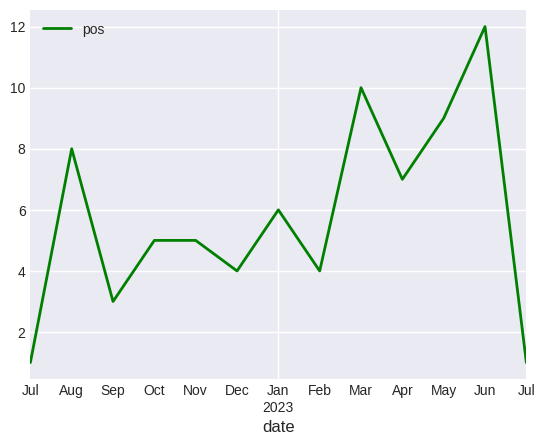

In [157]:
shorter_df['positive'].resample('M').sum().plot(color = 'g',label = 'pos').legend()

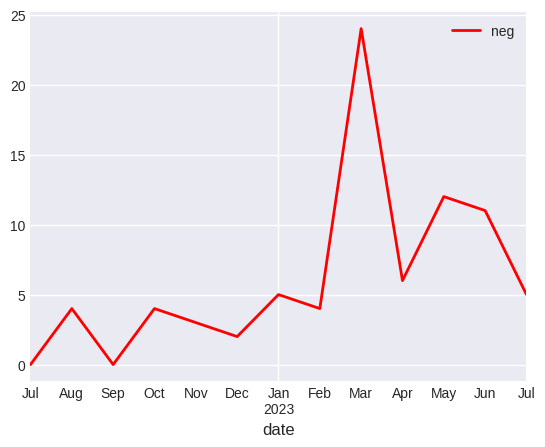

In [159]:
shorter_df['negative'].resample('M').sum().plot(color = 'r',label = 'neg').legend()

<Axes: xlabel='date'>

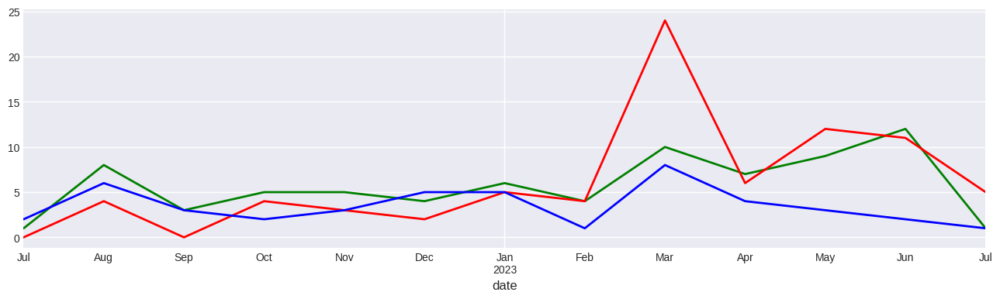

In [134]:
ax = shorter_df['positive'].resample('M').sum().plot(figsize=(16,4), color = 'green')
shorter_df['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'red')
shorter_df['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

In [118]:
import matplotlib.pyplot as plt
plt.style.use('default')

In [119]:
plt.style.use('Solarize_Light2')

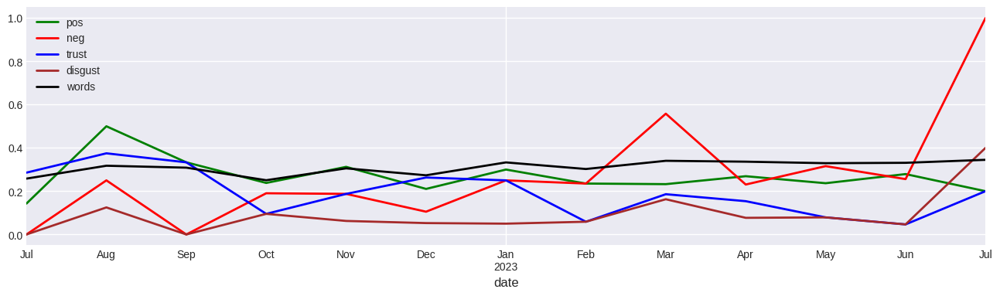

In [164]:
ax = shorter_df['positive'].resample('M').mean().plot(figsize=(16,4),
                                                          color = 'g', label='pos')
shorter_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax,
                                                   label = 'neg', color = 'r')
shorter_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax,
                                                label = 'trust',color = 'blue').legend()
shorter_df['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax,
                                                label = 'disgust',color = 'brown').legend()
(shorter_df['Title'].str.len().resample('M').mean()/280).plot(figsize=(16,4), ax = ax, # διαιρώ το mean των λέξεων με το 200 για να πλησιάσει στην κλίμακα τα άλλα
                                                label = 'words',color = 'black').legend()

<Axes: xlabel='date'>

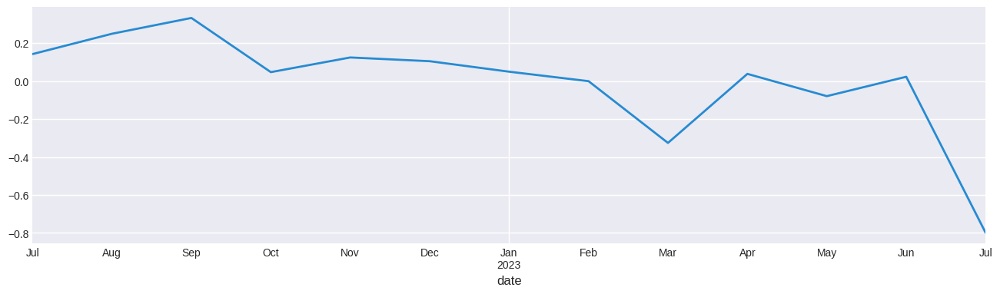

In [160]:
shorter_df['pos/neg'] = shorter_df['positive'] - shorter_df['negative']
shorter_df['pos/neg'].resample('M').mean().plot(figsize=(16,4))

In [122]:
plt.style.use('seaborn-v0_8-darkgrid')

<Axes: xlabel='date'>

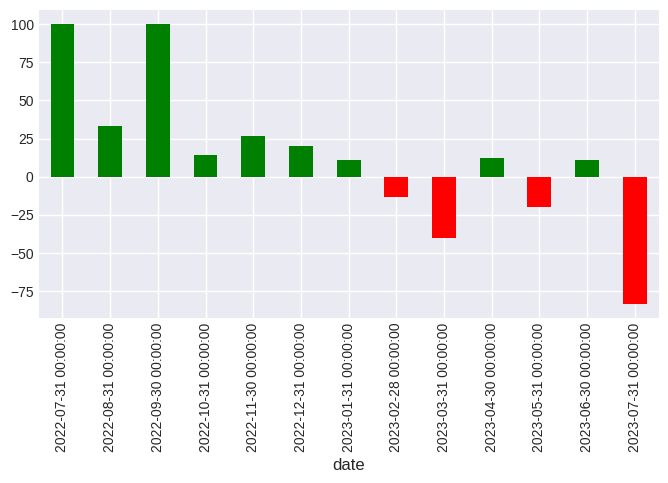

In [162]:
shorter_df['(-)αρνητικότητα | θετικότητα(+)'] = shorter_df.positive*100//shorter_df[['positive','negative']].sum(
        axis=1) - shorter_df.negative*100//shorter_df[['positive','negative']].sum(axis=1)

shorter_df['(-)αρνητικότητα | θετικότητα(+)'].resample('M').mean().plot(kind='bar',
                                                                               color=(shorter_df['(-)αρνητικότητα | θετικότητα(+)'].resample('M').mean()>0
                                                                               ).map({True: 'g', False: 'r'}), figsize=(8,4))

Άρθρο με τη μεγαλύτερη θετικότητα και άρθρο με τη μεγαλύτερη αρνητικότητα

In [124]:
shorter_df[(shorter_df['(-)αρνητικότητα | θετικότητα(+)'] == shorter_df['(-)αρνητικότητα | θετικότητα(+)'].max()) |
                  (shorter_df['(-)αρνητικότητα | θετικότητα(+)'] == shorter_df['(-)αρνητικότητα | θετικότητα(+)'].min())
                  ][['index', 'positive', 'negative', '(-)αρνητικότητα | θετικότητα(+)']]

,index,positive,negative,(-)αρνητικότητα | θετικότητα(+)
date,,,,
2023-07-03,1,0,1,-100.0
2023-07-01,3,0,1,-100.0
2023-07-01,4,0,1,-100.0
2023-06-30,5,0,1,-100.0
2023-06-30,7,1,0,100.0
...,...,...,...,...
2022-08-15,267,1,0,100.0
2022-08-10,269,0,1,-100.0
2022-08-10,271,2,0,100.0


In [163]:
filtered_df = shorter_df[
    (shorter_df['(-)αρνητικότητα | θετικότητα(+)'] == shorter_df['(-)αρνητικότητα | θετικότητα(+)'].max()) |
    (shorter_df['(-)αρνητικότητα | θετικότητα(+)'] == shorter_df['(-)αρνητικότητα | θετικότητα(+)'].min())
][['index', 'positive', 'negative', '(-)αρνητικότητα | θετικότητα(+)', 'Title']]

print(filtered_df)

            index  positive  negative  (-)αρνητικότητα | θετικότητα(+)  \
date                                                                     
2023-07-03      1         0         1                           -100.0   
2023-07-01      3         0         1                           -100.0   
2023-07-01      4         0         1                           -100.0   
2023-06-30      5         0         1                           -100.0   
2023-06-30      7         1         0                            100.0   
...           ...       ...       ...                              ...   
2022-08-15    267         1         0                            100.0   
2022-08-10    269         0         1                           -100.0   
2022-08-10    271         2         0                            100.0   
2022-08-05    272         2         0                            100.0   
2022-07-29    274         1         0                            100.0   

                                     

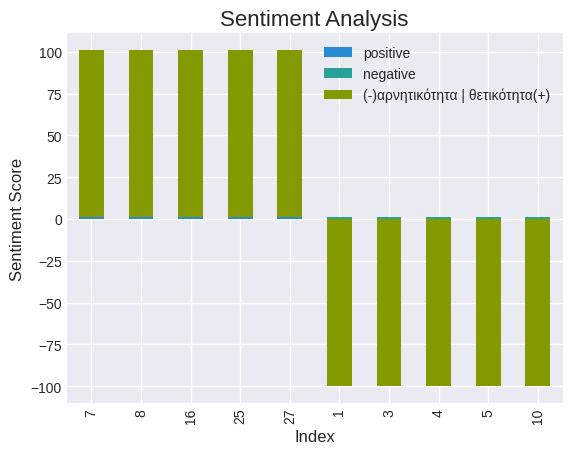

In [140]:
import matplotlib.pyplot as plt

# Τοπ 5 άρθρα με αρνητικό και τοπ 5 με θετικό προσημο
top_5 = shorter_df.nlargest(5, '(-)αρνητικότητα | θετικότητα(+)')[['index', 'positive', 'negative', '(-)αρνητικότητα | θετικότητα(+)']]
bottom_5 = shorter_df.nsmallest(5, '(-)αρνητικότητα | θετικότητα(+)')[['index', 'positive', 'negative', '(-)αρνητικότητα | θετικότητα(+)']]


filtered_df1 = pd.concat([top_5, bottom_5])

# το κάνουμε index
filtered_df1.set_index('index', inplace=True)

# Φτιάχνουμε το διάγραμμα για κάθε στήλη
filtered_df1.plot(kind='bar', stacked=True)

plt.title('Sentiment Analysis')
plt.xlabel('Index')
plt.ylabel('Sentiment Score')
plt.show()

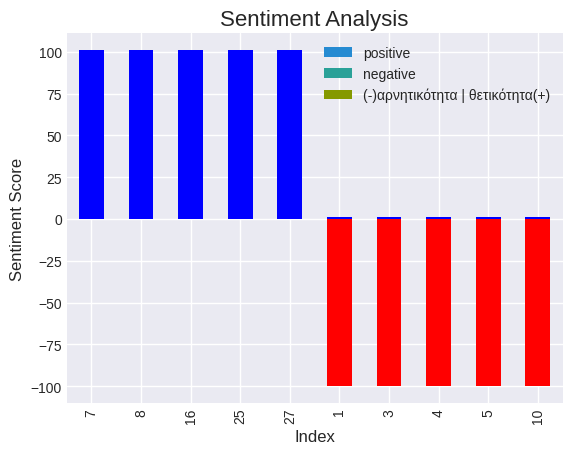

In [146]:
fig, ax = plt.subplots()


bars = filtered_df1.plot(kind='bar', stacked=True, ax=ax)


positive_color = 'blue'
negative_color = 'red'


for bar in bars.containers:
    for rect in bar:
        height = rect.get_height()
        rect.set_facecolor(positive_color if height > 0 else negative_color)

plt.title('Sentiment Analysis')
plt.xlabel('Index')
plt.ylabel('Sentiment Score')
plt.show()

In [144]:
#5 πιο θετικά άρθρα
top_5_positive = filtered_df.nlargest(5, '(-)αρνητικότητα | θετικότητα(+)')['Title']

#5 πιο αρνητικά άρθρα
top_5_negative = filtered_df.nsmallest(5, '(-)αρνητικότητα | θετικότητα(+)')['Title']

print("Top 5 πιο θετικά άρθρα:\n")
for title in top_5_positive:
    print(title)

print("\nTop 5 πιο αρνητικά άρθρα:\n")
for title in top_5_negative:
    print(title)

Top 5 πιο θετικά άρθρα:

Τη βοήθεια των social media ζητά ο Μακρόν για την αντιμετώπιση των επεισοδίων στη Γαλλία

Εικόνες από την καφετέρια στη Θεσσαλονίκη που κυριαρχούν οι γάτες - Στόχος το πρώτο «Cat Cafe»

Για χαλαρό καφέ στην Ερμού με δημοσιογράφους ο Μητσοτάκης - Τα σχέδια για διακοπές και το σχόλιο για την Wagner

«Μαγική» γαμήλια φωτογράφιση στην Τσιμισκή - Γαμπρός και νύφη γίνονται viral με τον χορό τους

Οι νέοι ενημερώνονται για τις ειδήσεις μέσω Tik Tok και Instagram – Τι έδειξε νέα μελέτη


Top 5 πιο αρνητικά άρθρα:

Γνωστή influencer εξηγεί γιατί πλήρωσε 616 ευρώ για ένα ψάρι στη Μύκονο - «Αυτό ήταν το λάθος μου»

Ξέφυγε τον κίνδυνο η 4χρονη Νεφέλη που τη δάγκωσε οχιά - Φίδι βγήκε «βόλτα» στην Τσιμισκή

Ρεκόρ 994 συλλήψεων στα επεισόδια στη Γαλλία - Σήμερα η κηδεία του 17χρονου που σκοτώθηκε από πυρά αστυνομικού

Βυθίζεται στο χάος η Γαλλία! Επεισόδια, εμπρησμοί, λεηλασίες και 45.000 αστυνομικοί στους δρόμους

Η ζαργάνα που «ψάρωσε» τους πάντες σε παραλία του Βόλου - Δεί